In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
os.chdir('..')

from face_detection import face_detection, non_max_suppression

In [3]:
dataset_path = os.path.join('dataset', 'test_face_detection')
image_files = [os.path.join(dataset_path, p) for p in os.listdir(dataset_path) if p.lower().endswith('.jpg')]

print(f"Found {len(image_files)} images in '{dataset_path}'")
if not image_files:
    print("No images to evaluate. Please verify dataset path.")

Found 1000 images in 'dataset\test_face_detection'


In [8]:
results = []
skipped_count = 0

color_map = {
    0: (0, 1, 0),
    1: (1, 0, 0),
    2: (0, 0, 1)
}

for image_path in image_files:
    frame = cv2.imread(image_path)
    if frame is None:
        skipped_count += 1
        continue

    faces = face_detection(frame.copy())

    for (x, y, w, h, v) in faces:
        cv2.rectangle(frame, (x, y), (x + w, y + h), tuple(c * 255 for c in color_map[v]), 2)

    results.append({
        'path': image_path,
        'recognized_faces': non_max_suppression(faces, iou_threshold=0.2),
        'annotated': frame,
        'variants': [v for (_, _, _, _, v) in faces],
    })

print(f"Evaluated {len(results)} images. Skipped {skipped_count} unreadable images.")


Evaluated 1000 images. Skipped 0 unreadable images.


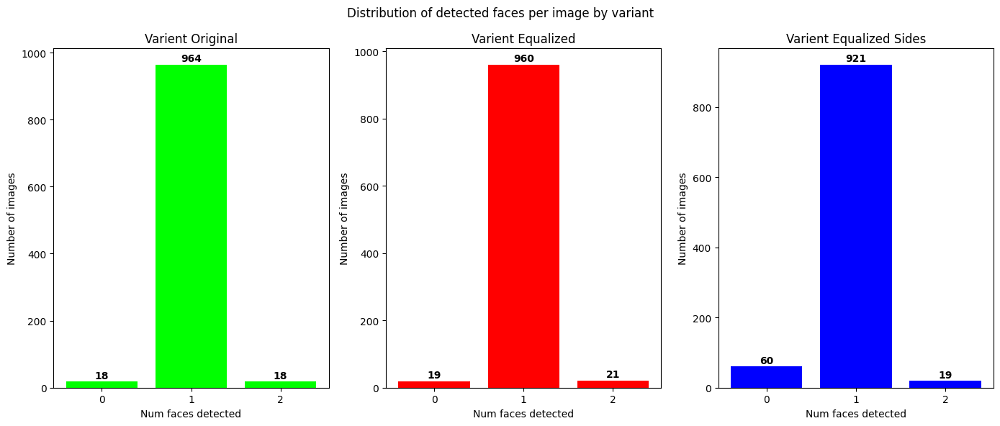

In [9]:
variant_labels = {
    0: "Original",
    1: "Equalized",
    2: "Equalized Sides"
}
variant_counts = {v: [] for v in variant_labels.keys()}

for r in results:
    counts_per_variant = {v: 0 for v in variant_labels.keys()}
    for v in r['variants']:
        if v in counts_per_variant:
            counts_per_variant[v] += 1
    for v in variant_labels.keys():
        variant_counts[v].append(counts_per_variant[v])

x = np.arange(len(results))

fig, axs = plt.subplots(1, 3, figsize=(14, 6))

for idx, v in enumerate(variant_labels.keys()):
    vals = variant_counts[v]
    unique_counts = sorted(set(vals))
    y = [vals.count(uc) for uc in unique_counts]
    bars = axs[idx].bar(unique_counts, y, color=color_map[v])
    axs[idx].set_xlabel(f"Num faces detected")
    axs[idx].set_ylabel("Number of images")
    axs[idx].set_title(f"Varient {variant_labels[v]}")
    axs[idx].set_xticks(unique_counts)
    for bar, count in zip(bars, y):
        axs[idx].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 3, f'{count}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.suptitle("Distribution of detected faces per image by variant")
plt.tight_layout()
plt.show()

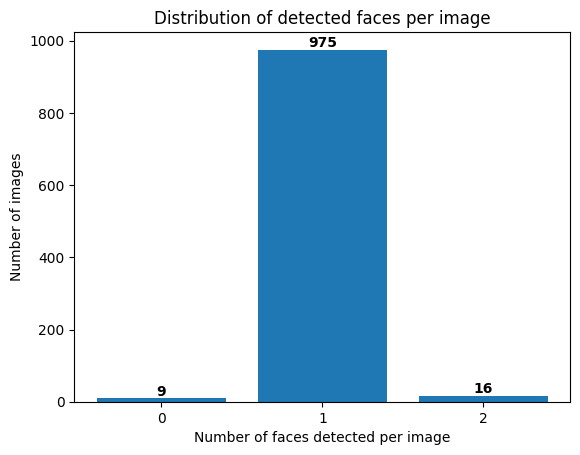

In [10]:
df = [len(r['recognized_faces']) for r in results]
x = sorted(set(df))
y = [df.count(val) for val in x]

bars = plt.bar(x, y)
plt.xlabel('Number of faces detected per image')
plt.ylabel('Number of images')
plt.title('Distribution of detected faces per image')
plt.xticks(x)
for bar, count in zip(bars, y):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{count}', ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.show()

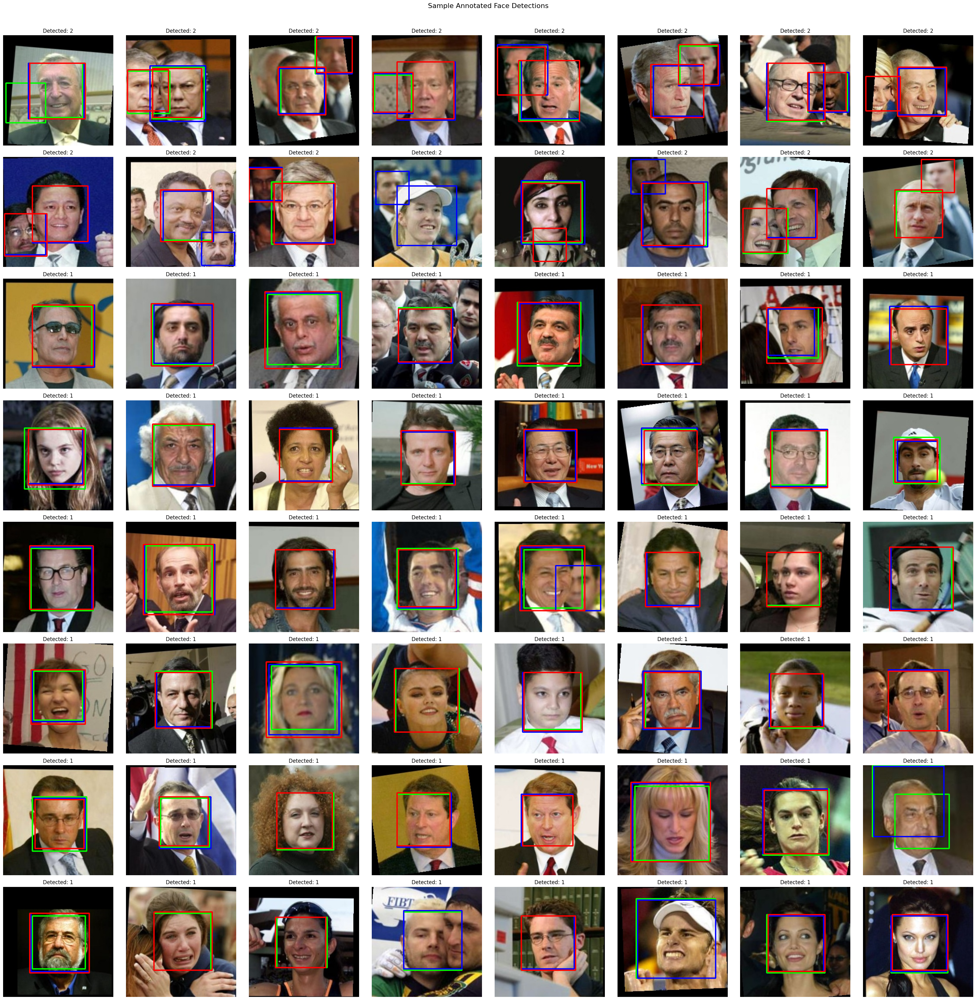

In [11]:
results = sorted(results, key=lambda x: -len(x['recognized_faces']))
num_examples = min(len(results), 64)
n_cols = 8
n_rows = (num_examples + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4))
axes = axes.flatten() if num_examples > 1 else [axes]
for i in range(num_examples):
    ax = axes[i]
    result = results[i]
    img_rgb = cv2.cvtColor(result['annotated'], cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    ax.set_title(f"Detected: {len(result['recognized_faces'])}")
    ax.axis('off')
for j in range(num_examples, len(axes)):
    axes[j].axis('off')
plt.suptitle("Sample Annotated Face Detections", y=1.01, fontsize=16)
plt.tight_layout()
plt.show()